## 1. 脏数据导致loss卡住
训练数据中  
"zhangjiayi is cute"  
"zhangjiayi is mygirlfriend"  
导致在训练过程中"zhangjiayi is"后面不知道跟什么，loss会卡在一个中间值无法下降  
解决：根据哪种表述在训练集中更多来决定  语言概率分布必然结果


tqdm随便加

## 2. 加casule mask 过程试错：
#### 1.mask矩阵用的是加法而不是乘法   -inf用不了乘法
#### 2.mask矩阵的形状确定：  要与QK之后的形状一致，  ***QKt的形状？？***
#### 3.QKt形状确定：***Q的形状？***
#### 4.X的形状？？！！
#### X:
由于有embedding升维度： 原本x_train是(batch_size , len_of_tokens)的形状 (没分batch，那batch_size就是一整个训练数据集大小)
embedding之后 每个token都被转换为一维embedding_dim长度的向量，所以x_train形状：
## X: batch_size X  len_of_tokens X embedding_dim

### Q:
x中每一个的(len_of_tokens , embedding_dim)，都经过W_q线性转换为（线性层实现）(len_of_tokens , d_k)
所以*shape of Q*=(batch_size , len_of_tokens , d_k)
K同理

### 综上： QKt.shape=(len_of_tokens,len_of_tokens),mask形状要一致

## 2.向量法实现 position embedding的时候：
向量法：对于大量数据，矩阵乘法计算相比于循环代价更低
## 1.继承自nn.Module类实现:便于跟踪梯度
## 2.分段过程：
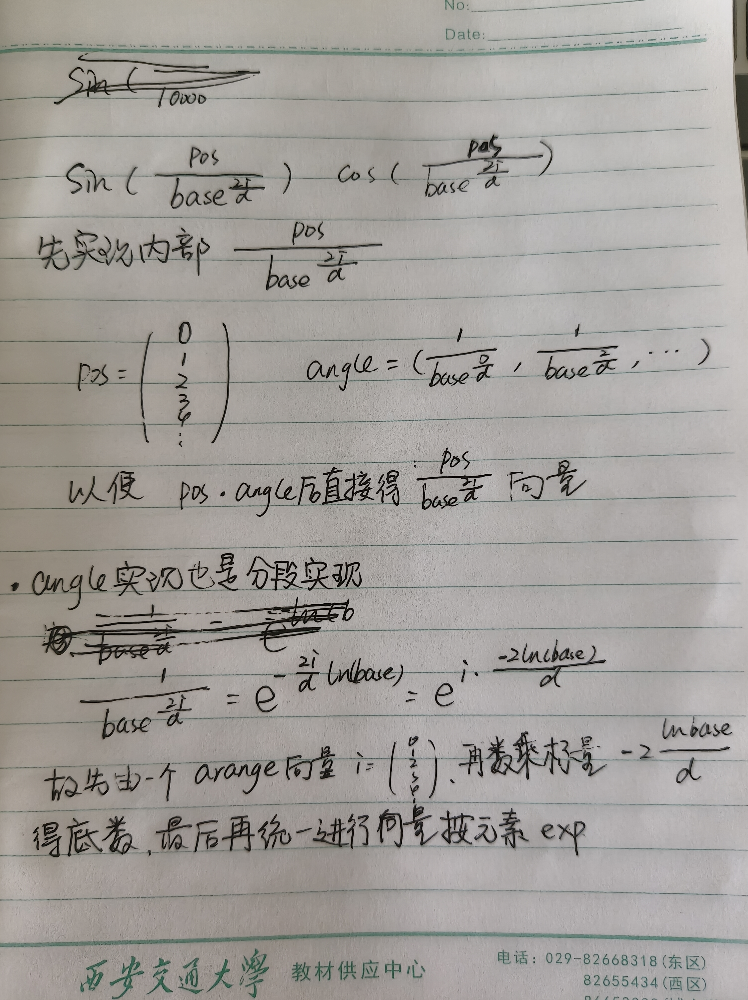

### torch中一维张量的局限：一个（n,）的张量没有行列之分，两个相乘只能是内积；但一个（n,1）张量会被认为是一个二维（列）向量，可以进行矩阵乘法 
*一维向量想计算就要升维，除非是内积*
如果要对一维张量进行矩阵乘法，就要升高维度为2d，实际上两者只有身份区别，在线性代数意义上几乎一致，
可以使用 .reshape(n, 1) 或 .view(n, 1) 将一维张量 (n,) 转换为二维列向量 (n, 1)  
也可以使用t.unsqueeze(1)  
t.unsqeeze(0)是将t.shape=(n,)向量升维为(1,n),也可以.reshape(1,n)/.view(1,n)

## 3.pe[:,0::2]=torch.sin(e)中0::2表示从0开始每隔两个取一个，实现了取奇/偶数列

## 4.擅用torch的广播机制 torch.exp,torch.sin/cos


## 5.匹配cross Entropy对多维输入的维度约定
y_pred的shape为（batch_size,len_tokens,vocab_size）  
第1个位置 → 72个词的 logits  
第2个位置 → 72个词的 logits  
第3个位置 → 72个词的 logits  
第4个位置 → 72个词的 logits  
loss=criterion(y_pred,y_train)
报错：Expected target size [15, 72],got [15, 4, 1]  
原因：CrossEntropyLoss对多维输入有维度约定，会将y_pred的（batch_size,len_tokens,vocab_size）理解为 15个batch，4个类别，每个样本72个位置，实际上正确的理解是：15个batch，72个类别，每个样本4个位置  
所以需要对y_pred的第2，3维度进行转置，这样target就是（15，4），与y_train形状一致

## 6.to(device)无法原地完成，必须接收！  
  model.to(device)  XXX  
###  model=model.to(device)  √√√  
放在gpu上训练速度更快

##  7.维度修改
### 1.reshape(),view():都是重新排布已有元素来实现，所以只能改变相邻维度
### 2.squeeze(维度编号)/unsqueeze(维度编号):值操作大小为 1 的维度（增减）

# 一些思考：

#### 实现的是一种自回归的语言模型
目标是给定前面的词学习下一个词

### 1.输出一个长度等于词表的概率向量，选取概率最高者作为预测的词
模型输出的分数向量: [0.1, 0.2, 3.5, 0.3, 0.1, 0.0]
正确答案（目标）:    2（"i" 的编号）

CrossEntropyLoss 会看：
  - 编号 2 对应的分数是 3.5，够不够高？
  - 其他编号的分数是不是够低？
  - 如果编号 2 的分数最高 → loss 小
  - 如果别的编号分数更高 → loss 大  
CrossEntropyLoss是softmax与交叉熵的结合，会自动的将输出的一行/列概率向量选取pred答案，与label相比
所以criterion只需要传入预测结果与label即可，剩下的步骤都会自动完成

不同任务选不同的optim.代价函数类型即可

### 2.那如何在我单头注意力训练的模型有生成训练库中不存在的文本的能力？
1.加大药量：关键在于让模型学到“词与词之间的搭配规律”而非“整句的固定顺序”。 只要训练数据足够丰富，模型就能把学过的局部规律重新组合，生成训练库中从未出现过的文本  
2.dropout一些“遗忘”激发创造力？  
3. 用温度采样（Temperature Sampling）
预测时不要用 argmax（只选概率最高的），而是用带温度的采样，让模型有概率选到“第二好”的词
### 数据多 + Dropout + 温度采样 → 模型能“创造”新文本

### 3. 如何单字预测？大量上下文预测？
单字预测的核心是固定短窗口滑动切分样本；大量上下文预测的核心是改用循环生成，将前一步输出拼回输入滚动预测。

### 4.报错：IndexError: Target 9 is out of bounds.
vocab是从0开始的，但是vocab_size是从1开始的，需要vocab_size+1

## 5.预测模式由训练数据分割方式、loss函数


## 6.dim0永远是batch_size
## 因为Linear输入通常默认为(batch_size,feature)，  
## conv2d输入通常要求是(batch_size,channel_num,Height,Width)